# Mauritius coast and potential impact of oil spill <img align="right" src="../Supplementary_data/DE_Africa_Logo_Stacked_RGB_small.jpg">

* **Products used:** 
[s2_l2a](https://explorer.digitalearth.africa/s2_l2a)

## Background

MV Wakashio ran aground off the south east coast of Mauritius on 25 July 2020 and spilled nearly 1,000 tonnes of fuel oil into the water in the following days.
This is expected to have a long term impact on the marine life and environment.

More [story](https://www.bbc.com/news/world-africa-53750151) and [photos of the oil spill](https://www.theatlantic.com/photo/2020/08/photos-growing-oil-spill-off-coast-mauritius/615136/).

## Description

This notebook investigtes how Sentinel-2 multi-spectral images can be used to measure and monitor the impact of the oil spill.


## Getting started
To run this analysis, run all the cells in the notebook, starting with the "Load packages" cell. 

### Load packages

In [1]:
%matplotlib inline

import numpy as np
import xarray as xr

import datacube
from odc.algo import xr_geomedian
import warnings
warnings.filterwarnings("ignore")

import sys
sys.path.append('../Scripts')
from deafrica_datahandling import load_ard, mostcommon_crs
from deafrica_plotting import rgb
from deafrica_dask import create_local_dask_cluster
from deafrica_bandindices import calculate_indices

### Set up a dask cluster

This will help keep our memory use down and conduct the analysis in parallel. If you'd like to view the `dask dashboard`, click on the hyperlink that prints below the cell. You can use the dashboard to monitor the progress of calculations.


In [2]:
create_local_dask_cluster()

Client Scheduler: tcp://127.0.0.1:40117 Dashboard: /user/fangfy/proxy/8787/status,Cluster Workers: 1 Cores: 15 Memory: 104.37 GB


### Connect to the datacube

In [3]:
dc = datacube.Datacube(app='mauritius')

## Load Sentinel-2 data from the datacube


In [4]:
# Create a query object
lat, lon = -20.405, 57.735
buffer = 0.04

query = {
    'time': ('2020-04', '2020-08'),
    'x': (lon - buffer, lon + buffer),
    'y': (lat + buffer, lat - buffer),
    'resolution':(-10, 10),
    'cloud_cover':(0, 60), # mostly cloudy scenes are exluded
    'group_by': 'solar_day'
}

# use all non-overlapping 10m and 20m bands
bands = ['blue', 'green', 'red', 'nir', 'nir_narrow', 'red_edge_1', 'red_edge_2',
         'red_edge_3', 'swir_1', 'swir_2']

#bands = ['blue', 'green', 'red', 'nir', 'swir_1']

# Identify the most common projection system in the input query
output_crs = mostcommon_crs(dc=dc, product='s2_l2a', query=query)


ds = load_ard(dc=dc,
              products=['s2_l2a'],
              dask_chunks={'x': 500, 'y':500},
              output_crs=output_crs,
              measurements=bands,
              **query)

# Print output data
print(ds)

Using pixel quality parameters for Sentinel 2
Finding datasets
    s2_l2a
Applying pixel quality/cloud mask
Returning 17 time steps as a dask array
<xarray.Dataset>
Dimensions:      (time: 17, x: 840, y: 890)
Coordinates:
  * time         (time) datetime64[ns] 2020-04-03T06:25:00 ... 2020-08-16T06:...
    spatial_ref  int32 32740
  * x            (x) float64 5.725e+05 5.725e+05 ... 5.809e+05 5.809e+05
  * y            (y) float64 7.748e+06 7.748e+06 ... 7.739e+06 7.739e+06
Data variables:
    blue         (time, y, x) float32 dask.array<chunksize=(1, 500, 500), meta=np.ndarray>
    green        (time, y, x) float32 dask.array<chunksize=(1, 500, 500), meta=np.ndarray>
    red          (time, y, x) float32 dask.array<chunksize=(1, 500, 500), meta=np.ndarray>
    nir          (time, y, x) float32 dask.array<chunksize=(1, 500, 500), meta=np.ndarray>
    nir_narrow   (time, y, x) float32 dask.array<chunksize=(1, 500, 500), meta=np.ndarray>
    red_edge_1   (time, y, x) float32 dask.array<ch

### Plot selected timesteps in true colour

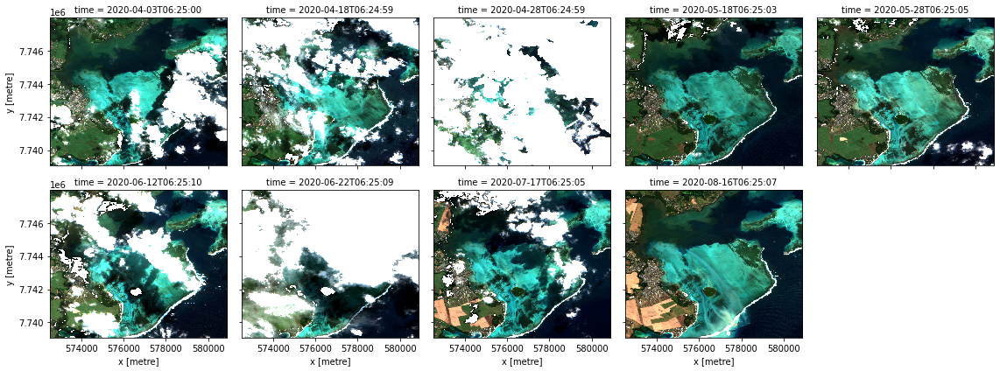

In [5]:
ds[['red','green','blue']].to_array().isel(time=slice(0,20,2)).plot.imshow(col='time', col_wrap=5, robust=True);

### Visualize the image from August

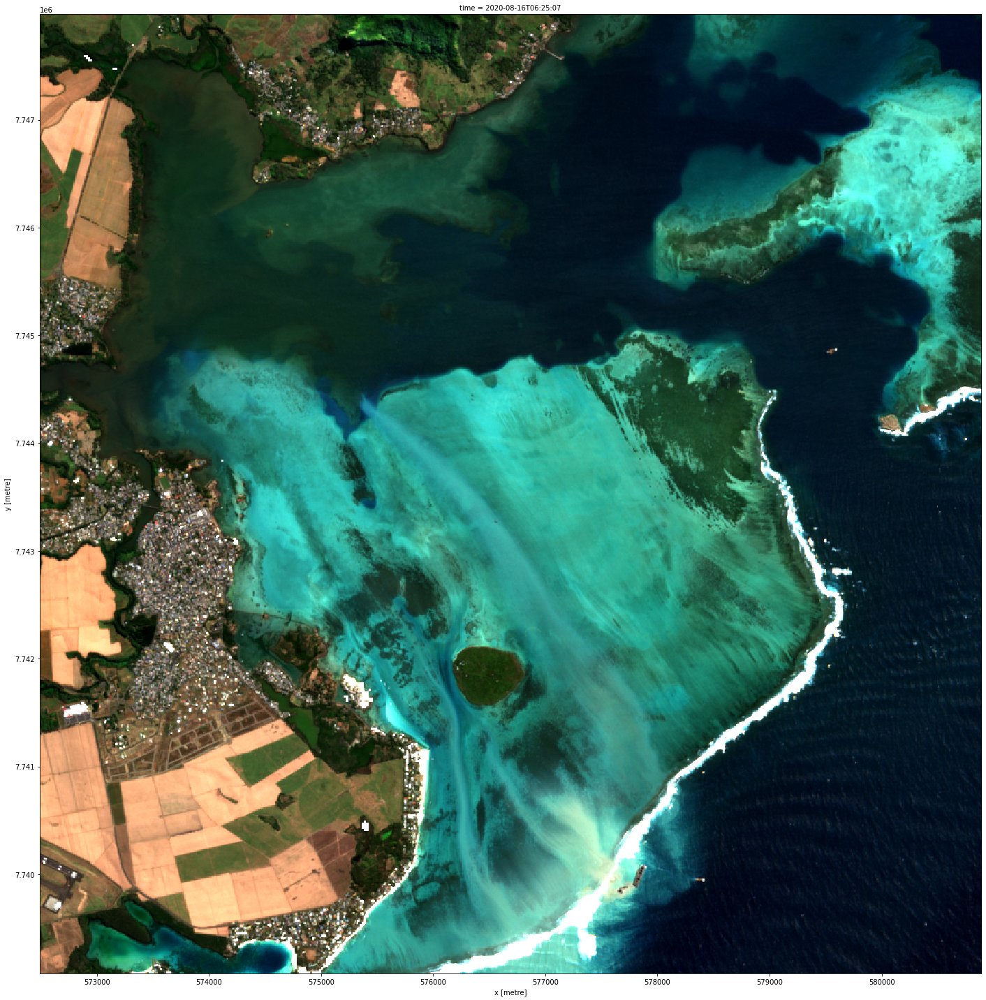

In [6]:
# Plot true color
rgb(ds.sel(time=slice('2020-08', '2020-08')), col='time', size=20);

## Generate a geomedian for images before August 2020

In [7]:
#generate a geomedian for before August 2020
geomedian = xr_geomedian(ds.sel(time=slice('2020-04','2020-07')))

In [8]:
%%time
geomedian = geomedian.compute()

CPU times: user 9.84 s, sys: 1.07 s, total: 10.9 s
Wall time: 5min 46s


### Stack pre- and post-event images and mask out land

In [9]:
# combine pre- and post- data into one dataset
combined_ds = xr.concat([geomedian.expand_dims({'time':['2020-07-01']}), ds.sel(time=slice('2020-08', '2020-08'))], dim='time')

In [10]:
# mask out non-water
calculate_indices(combined_ds, index='NDWI', collection='s2', deep_copy=False)
masked_ds = combined_ds.where(combined_ds.NDWI>0)

### Plot the masked pre- and post event images in true and false color

Plotting the result to visualize change.

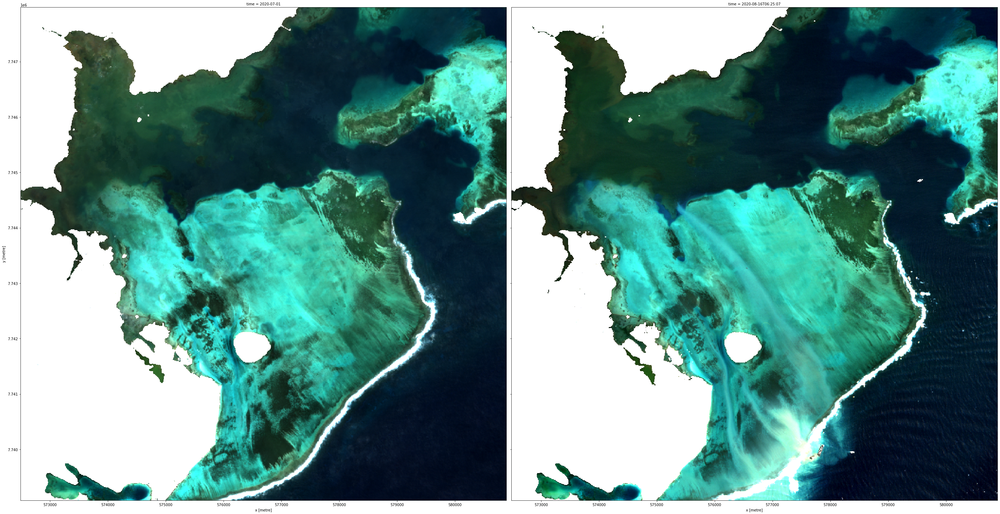

In [11]:
# Plot true color
rgb(masked_ds, col='time', col_wrap=2, size=20);

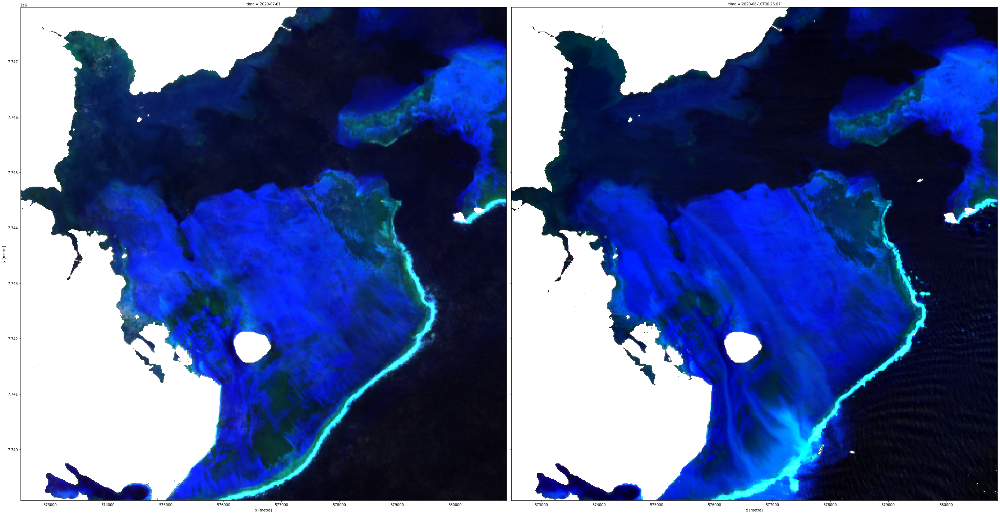

In [12]:
# Plot false color
rgb(masked_ds, bands=['swir_1', 'red_edge_1', 'green'], col='time', col_wrap=2, size=20)

## Run a Principle Component Analysis to highlight different surface types

This helps to visualize (in RGB) the different types of surface characterics that can be distinguished by the Sentinel-2 spectral bands.

In [13]:
from deafrica_classificationtools import sklearn_flatten, sklearn_unflatten
from sklearn.decomposition import PCA

X = sklearn_flatten(masked_ds)
pca = PCA(n_components=3)
pca.fit(X)
print("Relative variance in principal components:", pca.explained_variance_ratio_)
predict = pca.transform(X)
out = sklearn_unflatten(predict, masked_ds)
out = out.to_dataset(dim=out.dims[0]).transpose('time','y','x')

Relative variance in principal components: [0.85012867 0.12666984 0.01252049]


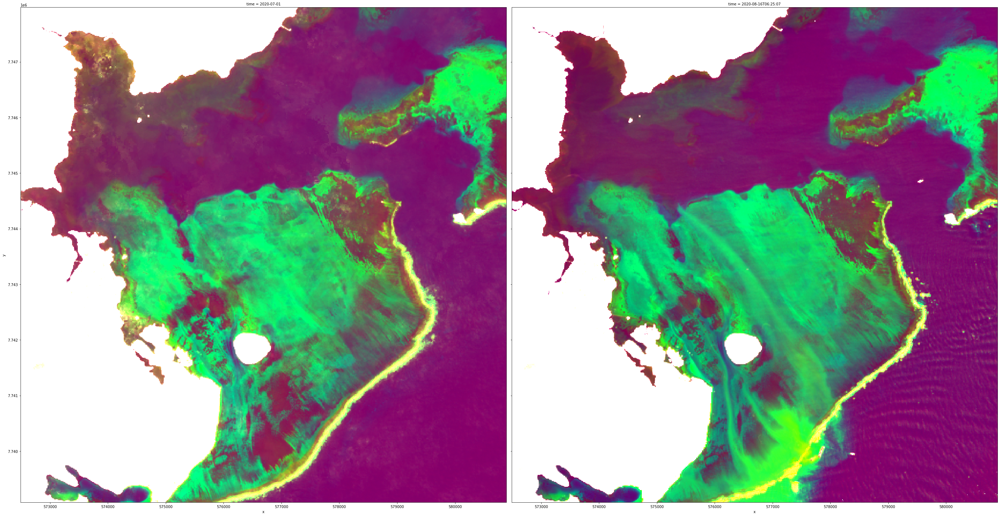

In [14]:
rgb(out, bands=[1,0,2], col='time', size=20)

***

## Additional information

**License:** The code in this notebook is licensed under the [Apache License, Version 2.0](https://www.apache.org/licenses/LICENSE-2.0). 
Digital Earth Africa data is licensed under the [Creative Commons by Attribution 4.0](https://creativecommons.org/licenses/by/4.0/) license.

**Contact:** If you need assistance, please post a question on the [Open Data Cube Slack channel](http://slack.opendatacube.org/) or on the [GIS Stack Exchange](https://gis.stackexchange.com/questions/ask?tags=open-data-cube) using the `open-data-cube` tag (you can view previously asked questions [here](https://gis.stackexchange.com/questions/tagged/open-data-cube)).
If you would like to report an issue with this notebook, you can file one on [Github](https://github.com/digitalearthafrica/deafrica-sandbox-notebooks).

**Last modified:** August 2020

**Compatible datacube version:**

In [15]:
print(datacube.__version__)

1.8.3.dev13+gbde57866


## Tags
Browse all available tags on the DE Africa User Guide's [Tags Index]()